<a href="https://colab.research.google.com/github/MAristyaP/PCVK_Genap_2021/blob/main/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

2. Implement 6 template matching methods in OpenCV using the cats_and_bunnies.jpg
and cat2_templatejpg.jpg images as templates.

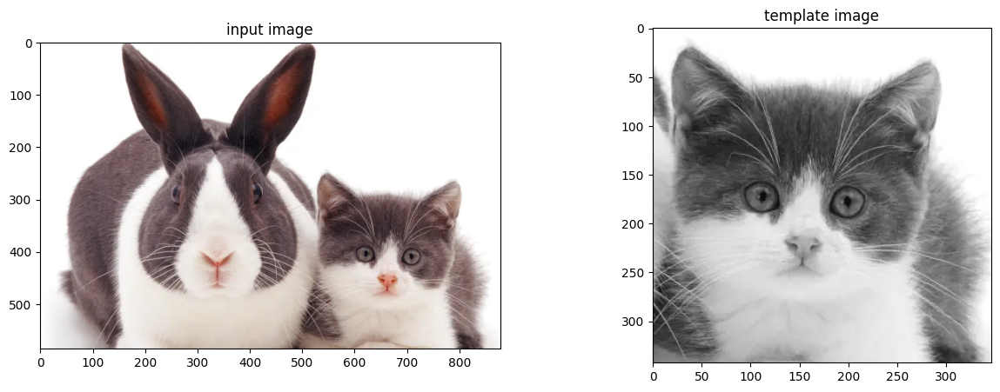

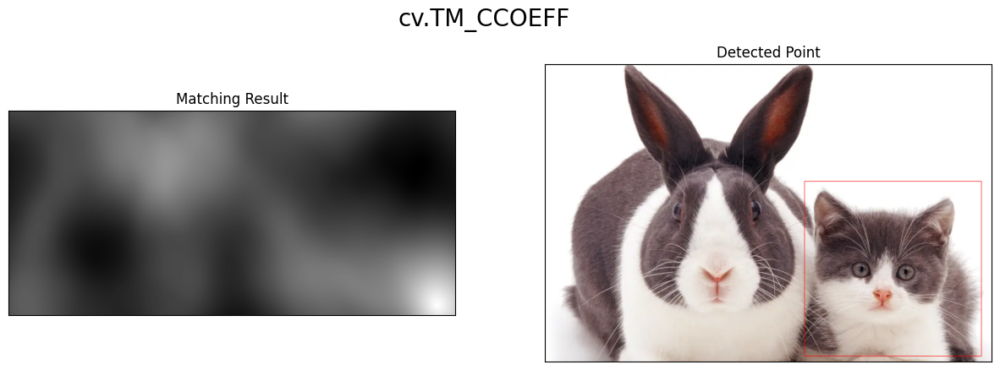

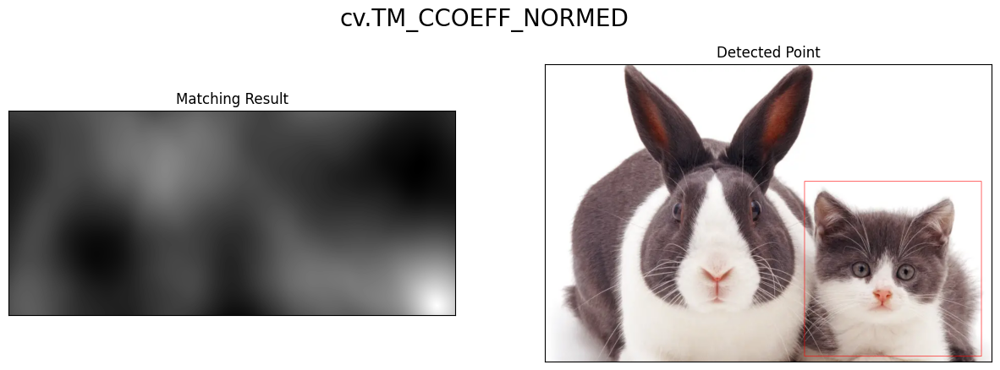

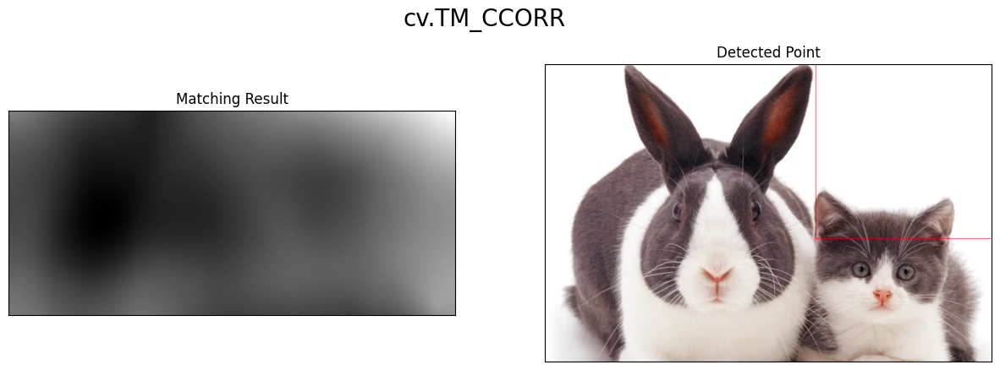

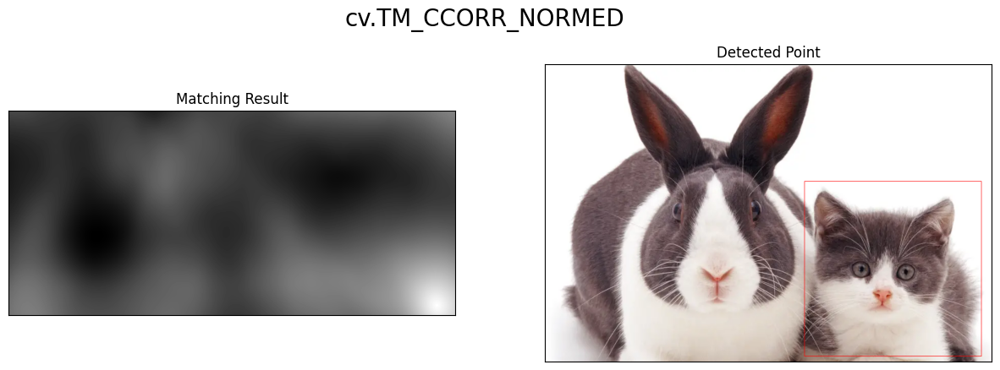

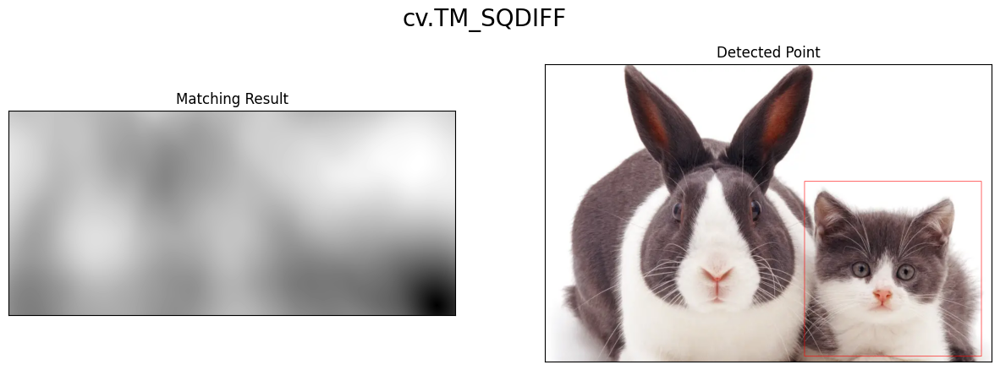

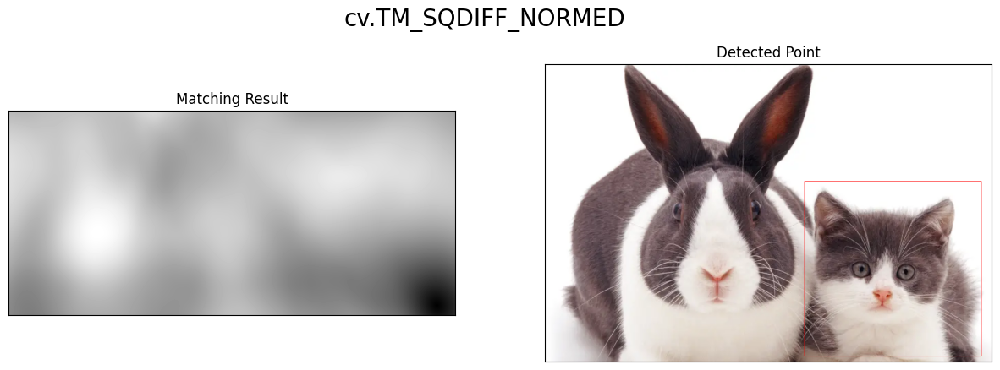

In [3]:
# load citra input
img = cv.imread('/content/drive/MyDrive/Images/cats_and_bunnies.jpg')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
img2 = img.copy()

#load citra template
template = cv.imread('/content/drive/MyDrive/Images/cats_template.jpg',0)
# dimensi citra
w, h = template.shape[::-1]

# print input image dan template
f, axarr = plt. subplots(1,2,figsize=(15,5)) #membuat 2 plot untuk citra input dan template
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("input image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("template image")

# All the 6 methods for comparison in a list
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img_gray,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv.rectangle(img,top_left, bottom_right,(0,0,255))
    plt.figure(figsize=(15,5))
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    print("\n\n")
    plt.suptitle(meth, fontsize=20)
    plt.show()

3. Implement the Sobel Edge Detection, Canny Edge Detection, and Laplacian Edge
Detection methods in OpenCV using the parking-lot-cars.jpg image, resulting in the
following output:

a. Sobel Edge Detection

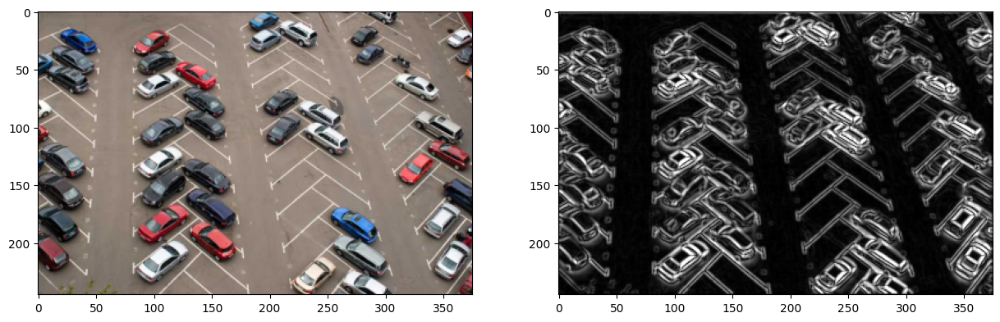

In [4]:
img0 = cv.imread('/content/drive/MyDrive/Images/parking-lot-cars.png')

# converting to gray scale
gray = cv.cvtColor(img0, cv.COLOR_BGR2GRAY)

# remove noise
img = cv.GaussianBlur(gray, (3, 3), 0)

# obtaining a horizontal and vertical Sobel filtering of the image
img_sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)
img_sobely = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)

# image with both horizontal and vertical Sobel kernels applied
img_sobelxy = cv.addWeighted(cv.convertScaleAbs(img_sobelx), 0.5, cv.convertScaleAbs(img_sobely), 0.5, 0)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
plt.subplot(121), plt.imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
plt.subplot(122), plt.imshow(img_sobelxy, cmap='gray')
plt.show()


b. Canny Edge Detection

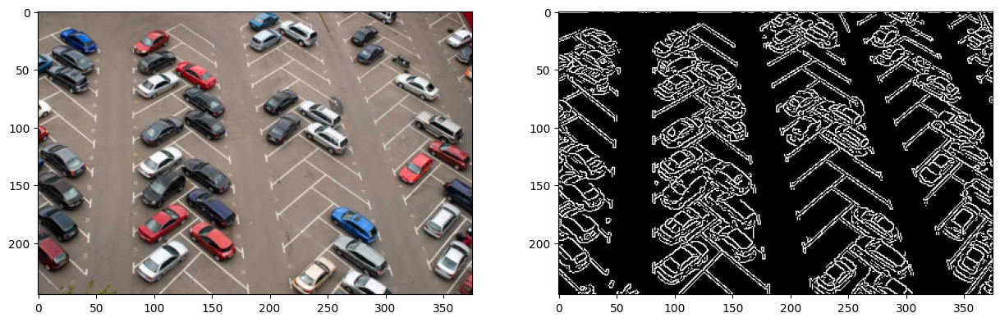

In [5]:
img0 = cv.imread('/content/drive/MyDrive/Images/parking-lot-cars.png')

edged = cv.Canny(img0, 100, 200)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
plt.subplot(121), plt.imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
plt.subplot(122), plt.imshow(edged, cmap='gray')
plt.show()

c. Laplacian Edge Detection

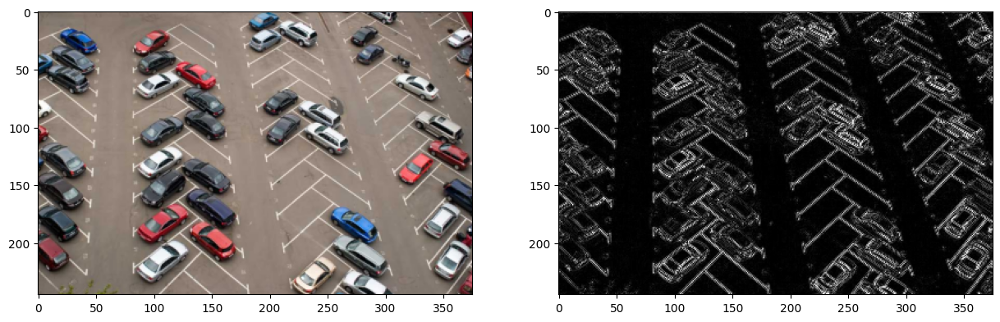

In [6]:
img0 = cv.imread('/content/drive/MyDrive/Images/parking-lot-cars.png')

# Convert the image to grayscale
gray = cv.cvtColor(img0, cv.COLOR_BGR2GRAY)

# Apply Laplacian edge detection
laplacian = cv.Laplacian(gray, cv.CV_64F)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
plt.subplot(121), plt.imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
plt.subplot(122), plt.imshow(cv.convertScaleAbs(laplacian), cmap='gray')
plt.show()


4. Implement the Sobel Edge Detection, Canny Edge Detection, and Laplacian Edge
Detection methods in OpenCV using the parking-lot-cars.jpg image, resulting in the
following output:

a. Harris Corner Detection

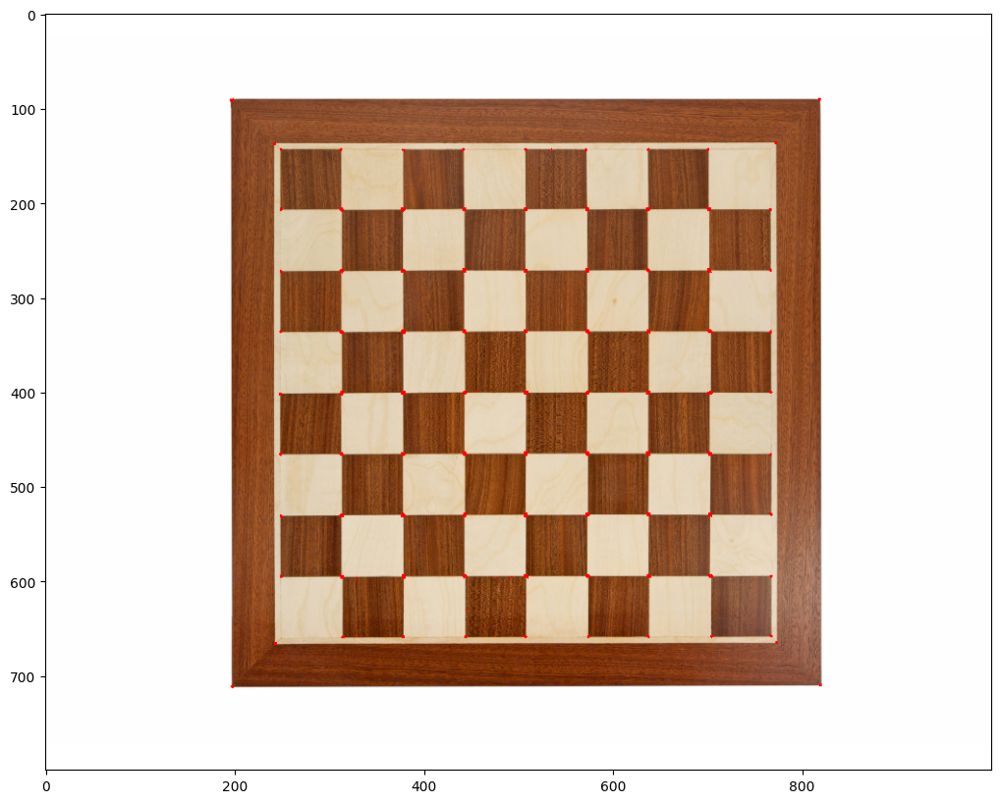

In [7]:
input_img = cv.imread('/content/drive/MyDrive/Images/Object Detection/chess-board.jpg')
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)
dst = cv.cornerHarris(gray_img,3,1,0.04)

gray_img = np.float32(gray_img)
harris_output = cv.cornerHarris(gray_img,2,3, 3)
#hasil harris corner dilakukan dilasi untuk menandai sudut
harris_output = cv.dilate(harris_output, None)

#Threshold untuk mengoptimalkan nilai
input_img[dst>0.01*dst.max()]=[0,0,255]

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

b. Shi-Tomasi Detection

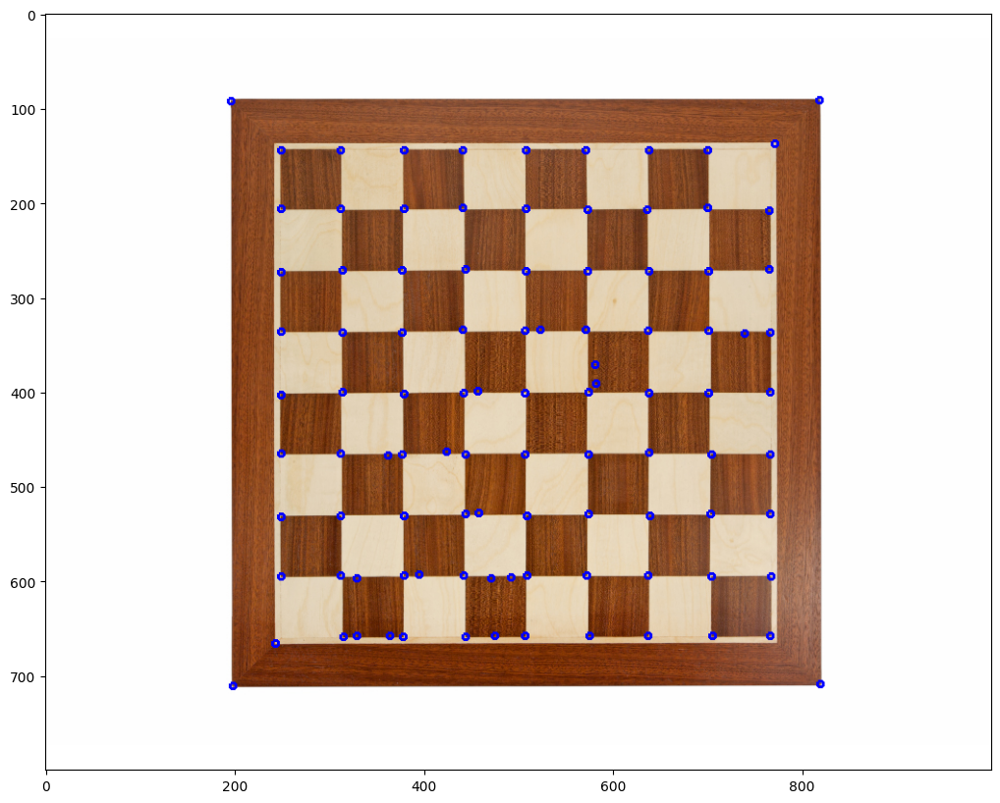

In [8]:
input_img = cv.imread('/content/drive/MyDrive/Images/Object Detection/chess-board.jpg')
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

corners = cv.goodFeaturesToTrack(gray_img, 100,0.01,10)
corners = np. int0(corners)
for i in corners:
    x,y = i.ravel()
    cv.circle(input_img, (x,y),3,255,2)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

5. Implement the Hough Transform method in OpenCV using the sudoku.jpg image. The
stages of the grid detection process are in accordance with those contained in the
theoretical review, resulting in the following output:

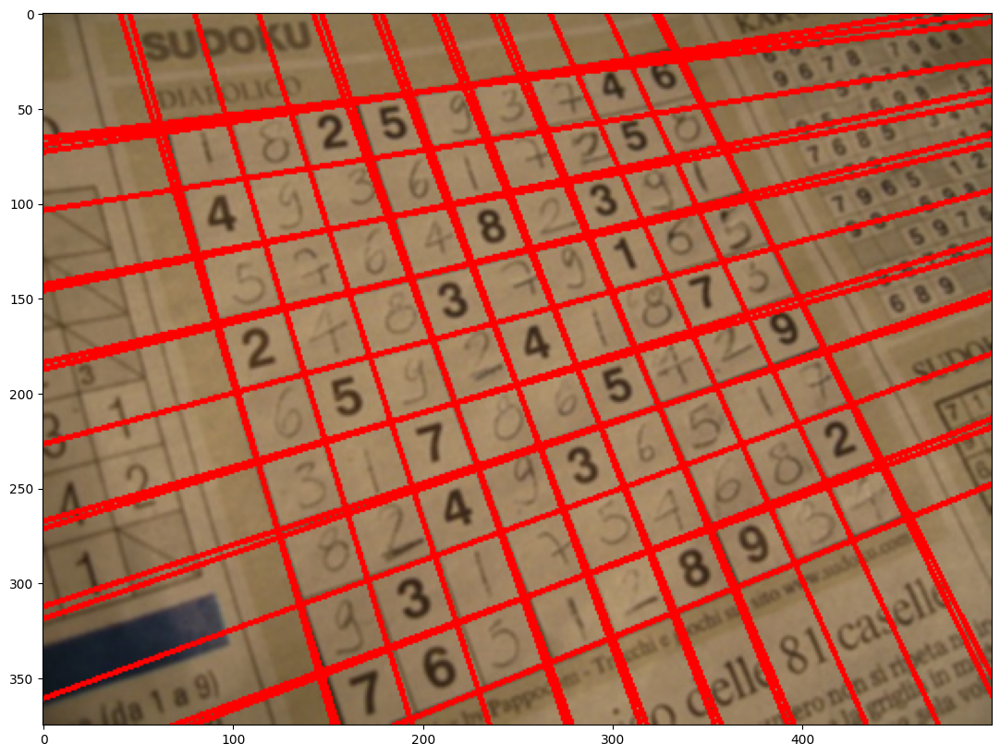

In [9]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

input_img = cv.imread('/content/drive/MyDrive/Images/Object Detection/sudoku.jpg')
img_gray = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

edges = cv.Canny(img_gray, 90, 150, apertureSize=3)

kernel = np.ones((3, 3), np.uint8)
edges = cv.dilate(edges, kernel, iterations=1)

kernel = np.ones((5, 5), np.uint8)
edges = cv.erode(edges, kernel, iterations=1)

lines = cv.HoughLines(edges, 1, np.pi/180, 150)

if not lines.any():
    print('No lines were found')
    exit()

for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))

    cv.line(input_img, (x1, y1), (x2, y2), (0, 0, 255), 2)

plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))
plt.show()

6. Implement the findContours () function in OpenCV for contour detection using the
laptop.jpg image, resulting in the following output:

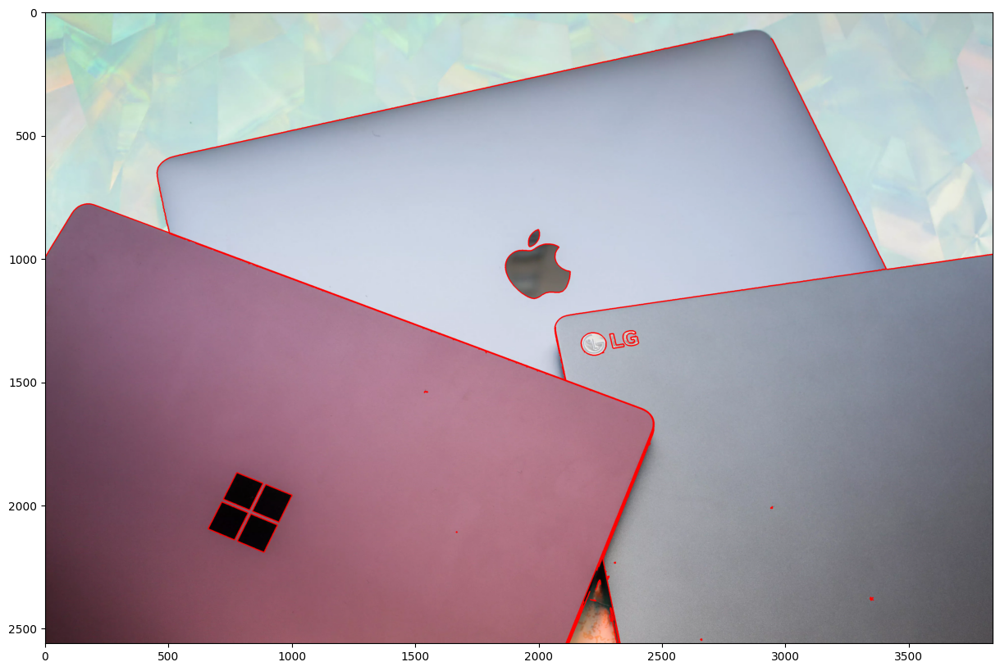

In [10]:
img = cv.imread('/content/drive/MyDrive/Images/Object Detection/laptop.jpg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

edged = cv.Canny(img_gray, 30, 200)

contours, hierarchy = cv.findContours(edged, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

cv.drawContours(img, contours, -1, (0,0,255), 3)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

3. Implementasikan konsep template matching tanpa menggunakan library OpenCV
untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan
bahrain-template.jpg sebagai citra template, sehingga menghasilkan output sebagai
berikut:

In [12]:
import numpy as np
import cv2 as cv

# Fungsi untuk melakukan template matching
def template_matching(image, template, threshold):
    image_height, image_width = image.shape
    template_height, template_width = template.shape

    match_results = []

    for y in range(image_height - template_height + 1):
        for x in range(image_width - template_width + 1):
            roi = image[y:y + template_height, x:x + template_width]
            score = np.sum((roi - template) ** 2)  # Menggunakan squared difference sebagai metrik

            # Jika skor rendah (sesuai dengan template), tambahkan ke hasil
            if score < threshold:
                match_results.append((x, y, score))

    return match_results

# Fungsi untuk menandai hasil template matching pada gambar
def mark_matches(image, match_results, template_width, template_height):
    marked_image = image.copy()

    for x, y, score in match_results:
        cv.rectangle(marked_image, (x, y), (x + template_width, y + template_height), (0, 255, 0), 2)

    return marked_image

# Baca gambar
image = cv.imread('/content/drive/MyDrive/Images/Object Detection/bahrain.jpg', cv.IMREAD_GRAYSCALE)
template = cv.imread('/content/drive/MyDrive/Images/Object Detection/bahrain-template.jpg', cv.IMREAD_GRAYSCALE)

# Tentukan ambang batas untuk kecocokan
threshold = 10000  # Sesuaikan sesuai dengan kebutuhan Anda

# Lakukan template matching
match_results = template_matching(image, template, threshold)

# Tandai hasil pada gambar asli
marked_image = mark_matches(image, match_results, template.shape[1], template.shape[0])

# Tampilkan gambar asli dan gambar yang ditandai
cv.imshow('Original Image', image)
cv.imshow('Marked Image', marked_image)
cv.waitKey(0)
cv.destroyAllWindows()


4. Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian
Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg, sehingga
menghasilkan luaran sebagai berikut:

a. Sobel Edge Detection

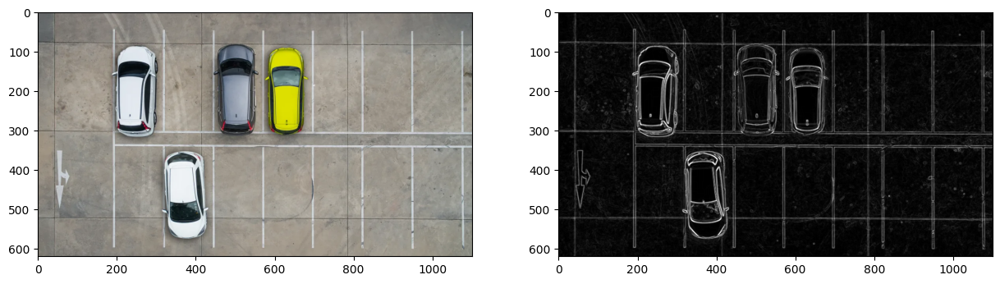

In [13]:
img0 = cv.imread('/content/drive/MyDrive/Images/Object Detection/car-park.jpg')

# converting to gray scale
gray = cv.cvtColor(img0, cv.COLOR_BGR2GRAY)

# remove noise
img = cv.GaussianBlur(gray, (3, 3), 0)

# obtaining a horizontal and vertical Sobel filtering of the image
img_sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)
img_sobely = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)

# image with both horizontal and vertical Sobel kernels applied
img_sobelxy = cv.addWeighted(cv.convertScaleAbs(img_sobelx), 0.5, cv.convertScaleAbs(img_sobely), 0.5, 0)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
plt.subplot(121), plt.imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
plt.subplot(122), plt.imshow(img_sobelxy, cmap='gray')
plt.show()

b. Canny Edge Detection

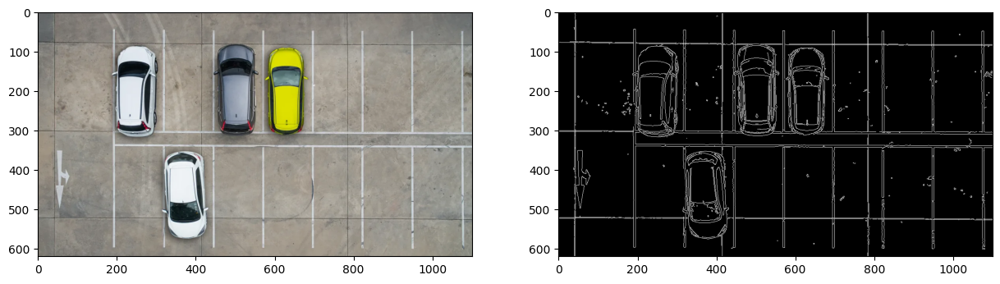

In [14]:
img0 = cv.imread('/content/drive/MyDrive/Images/Object Detection/car-park.jpg')

edged = cv.Canny(img0, 100, 200)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
plt.subplot(121), plt.imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
plt.subplot(122), plt.imshow(edged, cmap='gray')
plt.show()

c. Laplacian Edge Detection

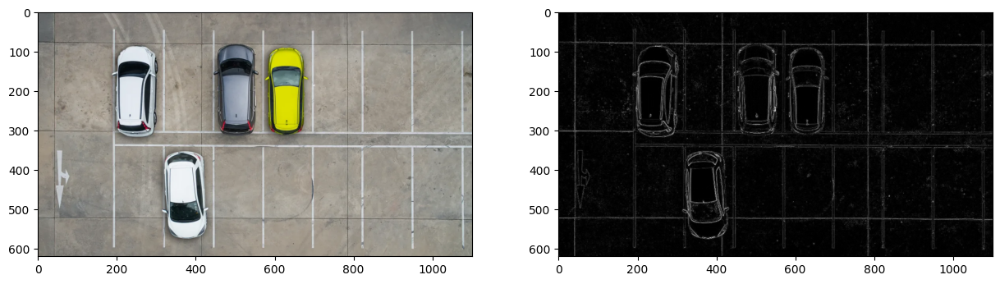

In [15]:
img0 = cv.imread('/content/drive/MyDrive/Images/Object Detection/car-park.jpg')

# Convert the image to grayscale
gray = cv.cvtColor(img0, cv.COLOR_BGR2GRAY)

# Apply Laplacian edge detection
laplacian = cv.Laplacian(gray, cv.CV_64F)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
plt.subplot(121), plt.imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
plt.subplot(122), plt.imshow(cv.convertScaleAbs(laplacian), cmap='gray')
plt.show()

E. Pengayaan Materi KTP

In [17]:
import cv2
import os
from google.colab.patches import cv2_imshow

5. Lakukan konversi grayscale untuk setiap hasil citra yang tereduksi noise dan lanjutkan dengan
binerisasi citra (thresholding)

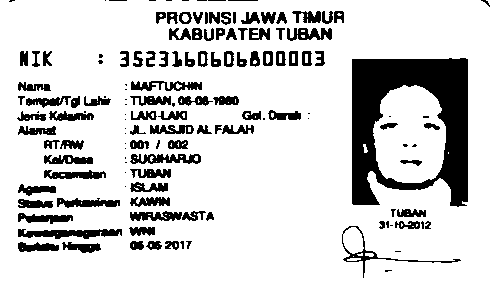

In [18]:
# Lokasi hasil pelat
src = cv.imread("/content/drive/MyDrive/Images/KTP_More/KTP_More/ktp3.png")
blurred = cv2.GaussianBlur(src, (5, 5), 0.5)

# Ubah ke grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY
+ cv2.THRESH_OTSU)

erode = cv2.erode(bw.copy(),cv2.getStructuringElement(cv2.MORPH_OPEN,(1,1)))

cv2_imshow(erode)


7. Terapkan ekstraksi kontur untuk untuk mendapatkan semua kontur setiap karakter/obyek.
Kontur harus diseleksi berdasarkan ukuran dan rasio sebuah karakter. Karakter/obyek di
dalam KTP ini bervariasi ukuran dan rasionya, sehingga setiap karakter/obyek perlu
penanganan yang berbeda. Contoh pada praktik ini berfokus pada karakter yang seukuran
dengan NIK. Jika hasil ekstraksi kontur memperlihatkan hasil lain yaitu karakter lain
terdeteksi, hal tersebut wajar karena perlu optimize code dan preprocessing yang lebih baik
(karena hasil akuisisi setiap citra dapat berbeda).

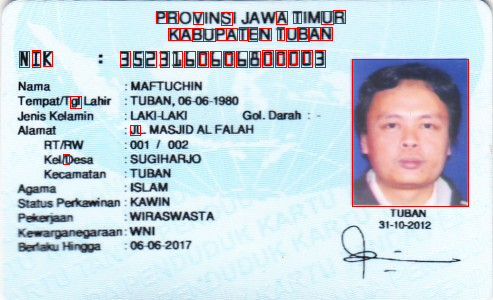

In [19]:
# Baca gambar KTP
ktpImage = cv2.imread('/content/drive/MyDrive/Images/KTP_More/KTP_More/ktp3.png')

# Ubah gambar menjadi skala abu-abu untuk deteksi tepi
gray = cv2.cvtColor(ktpImage, cv2.COLOR_BGR2GRAY)

blurred = cv2.GaussianBlur(gray, (5, 5), 0)  # (5, 5) adalah ukuran kernel Gaussian, dan 0 adalah deviation

# Thresholding untuk membuat gambar biner
ret, thresholded = cv2.threshold(blurred, 127, 255, cv2.THRESH_BINARY)

# Deteksi tepi menggunakan Canny


# Temukan kontur pada gambar tepi
contours,  hierarchy= cv2.findContours(thresholded, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

# Gambar kontur pada gambar asli
for cnt in contours:
    x, y, w, h = cv.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
      cv.rectangle(ktpImage, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 10 and w >= 5 and float(ras) <= 1:
      cv.rectangle(ktpImage, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

# Tampilkan gambar dengan kontur
cv2_imshow(ktpImage)